In [136]:
import pytesseract
print(pytesseract.get_tesseract_version())

5.5.1


In [137]:
import pytesseract
import os

# ✅ 1. Point to tesseract.exe inside your conda env
pytesseract.pytesseract.tesseract_cmd = r"C:\Users\ASUS\anaconda3\envs\myenv\Library\bin\tesseract.exe"

# ✅ 2. Point to the folder that CONTAINS the `tessdata` folder — not the tessdata folder itself!
os.environ["TESSDATA_PREFIX"] = r"C:\Users\ASUS\anaconda3\envs\myenv\share\tessdata"


In [138]:
import cv2
import pytesseract
import rasterio
from rasterio.transform import Affine
import pandas as pd

# Optional: set path to tesseract executable (for Windows)
# pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'

# Load image
image_path = "C:/Users/ASUS/Documents/karabakh_geotiff.tif"
image = cv2.imread(image_path)

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Use OCR to extract text with coordinates
ocr_data = pytesseract.image_to_data(gray, output_type=pytesseract.Output.DICT)

# Open GeoTIFF to access coordinate transformation
with rasterio.open(image_path) as src:
    transform: Affine = src.transform
    crs = src.crs

    settlements = []

    for i, word in enumerate(ocr_data["text"]):
        if word.strip() != "" and int(ocr_data["conf"][i]) > 70:
            x_px = ocr_data["left"][i] + ocr_data["width"][i] // 2
            y_px = ocr_data["top"][i] + ocr_data["height"][i] // 2

            # Convert pixel to geographic coordinates
            lon, lat = transform * (x_px, y_px)

            settlements.append({
                "name": word.strip(),
                "latitude": lat,
                "longitude": lon,
                "confidence": ocr_data["conf"][i]
            })

# Convert to DataFrame and save
df = pd.DataFrame(settlements)
df = df.drop_duplicates(subset=["name", "latitude", "longitude"])
df.to_csv("karabakh_settlements.csv", index=False)

print(f"✅ Saved {len(df)} settlements to karabakh_settlements.csv")


: 

: 

In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from tqdm import tqdm
import time

# Dictionary of URLs and their page count
url_page_map = {
    "https://kataloq.gomap.az/en/all-poi/settlements/big-city": 1,
    "https://kataloq.gomap.az/en/all-poi/settlements/town": 8,
    "https://kataloq.gomap.az/en/all-poi/settlements/small-town": 7,
    "https://kataloq.gomap.az/en/all-poi/settlements/village": 27,
    "https://kataloq.gomap.az/en/all-poi/settlements/big-village": 7,
    "https://kataloq.gomap.az/en/all-poi/settlements/suburban-village": 1,
    "https://kataloq.gomap.az/en/all-poi/settlements/big-settlement": 59,
    "https://kataloq.gomap.az/en/all-poi/settlements/settlement": 307,
    "https://kataloq.gomap.az/en/all-poi/settlements/small-settlement": 180
}

# Setup headless Chrome
options = Options()
options.add_argument("--headless")
options.add_argument("--disable-notifications")
options.add_argument("--disable-popup-blocking")
driver = webdriver.Chrome(options=options)

all_listing_urls = []

try:
    for base_url, page_count in url_page_map.items():
        tqdm_desc = base_url.split("/")[-1]
        for page in tqdm(range(1, page_count + 1), desc=f"Crawling {tqdm_desc}", leave=True):
            full_url = f"{base_url}?pg={page}"
            driver.get(full_url)
            time.sleep(1.5)  # Adjust for slower network
            
            try:
                container = driver.find_element(By.XPATH, "/html/body/div/div/div[2]/div[2]/div[4]/ul")
                links = container.find_elements(By.TAG_NAME, "a")
                page_links = [link.get_attribute("href") for link in links if link.get_attribute("href")]
                all_listing_urls.extend(page_links)
            except Exception as e:
                print(f"[!] Error on {full_url}: {e}")
except KeyboardInterrupt:
    print("Stopped by user.")
finally:
    driver.quit()

# Print or save results
print(f"\n✅ Total URLs collected: {len(all_listing_urls)}")

# Optional: Save to a file
with open("collected_urls.txt", "w", encoding="utf-8") as f:
    for url in all_listing_urls:
        f.write(url + "\n")


Crawling settlement:  49%|████▉     | 150/307 [08:59<09:24,  3.60s/it]


Stopped by user.

✅ Total URLs collected: 3887


In [ ]:
url_page_map = {
    "https://kataloq.gomap.az/en/all-poi/settlements/big-city": 1,
    "https://kataloq.gomap.az/en/all-poi/settlements/town": 8,
    "https://kataloq.gomap.az/en/all-poi/settlements/small-town": 7,
    "https://kataloq.gomap.az/en/all-poi/settlements/village": 27,
    "https://kataloq.gomap.az/en/all-poi/settlements/big-village": 7,
    "https://kataloq.gomap.az/en/all-poi/settlements/suburban-village": 1,
    "https://kataloq.gomap.az/en/all-poi/settlements/big-settlement": 59,
    "https://kataloq.gomap.az/en/all-poi/settlements/settlement": 307,
    "https://kataloq.gomap.az/en/all-poi/settlements/small-settlement": 180
}

all_paginated_urls = []

for base_url, max_page in url_page_map.items():
    for page in range(1, max_page + 1):
        if page == 1:
            all_paginated_urls.append(base_url)
        else:
            all_paginated_urls.append(f"{base_url}?pg={page}")

# Output or save to file
print(f"Generated {len(all_paginated_urls)} URLs.")
for url in all_paginated_urls:
    print(url)

# Optional: Save to file
with open("all_paginated_urls.txt", "w", encoding="utf-8") as f:
    for url in all_paginated_urls:
        f.write(url + "\n")

Generated 597 URLs.
https://kataloq.gomap.az/en/all-poi/settlements/big-city
https://kataloq.gomap.az/en/all-poi/settlements/town
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=2
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=3
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=4
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=5
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=6
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=7
https://kataloq.gomap.az/en/all-poi/settlements/town?pg=8
https://kataloq.gomap.az/en/all-poi/settlements/small-town
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=2
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=3
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=4
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=5
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=6
https://kataloq.gomap.az/en/all-poi/settlements/small-town?pg=7
https://kataloq.gomap

In [ ]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from selenium.webdriver.common.by import By
from tqdm import tqdm
import time

# Load collected listing URLs from file
with open("collected_urls.txt", "r", encoding="utf-8") as f:
    listing_urls = [line.strip() for line in f if line.strip()]

# Setup headless Chrome
options = Options()
options.add_argument("--headless")
options.add_argument("--disable-notifications")
options.add_argument("--disable-popup-blocking")
driver = webdriver.Chrome(options=options)

image_results = []

try:
    for url in tqdm(listing_urls, desc="Scraping images"):
        driver.get(url)
        time.sleep(1.5)  # Wait for page to load

        try:
            img_element = driver.find_element(By.XPATH, '//*[@id="x-poi-image-map-url"]/img')
            img_url = img_element.get_attribute("src")
        except Exception:
            img_url = None  # No image found

        image_results.append((url, img_url))
except KeyboardInterrupt:
    print("Aborted by user.")
finally:
    driver.quit()

# Print summary
print(f"\n✅ Total pages visited: {len(image_results)}")
found = sum(1 for _, img in image_results if img)
print(f"🖼️ Images found: {found}")
print(f"❌ Missing images: {len(image_results) - found}")

# Optional: Save results
with open("url_image_results.csv", "w", encoding="utf-8") as f:
    f.write("page_url,image_url\n")
    for page_url, image_url in image_results:
        f.write(f"{page_url},{image_url or ''}\n")


In [ ]:
df = pd.read_csv('C:/Users/ASUS/Downloads/custom_extraction_all_settlements.csv')

In [ ]:
import pandas as pd
from bs4 import BeautifulSoup
from urllib.parse import urljoin

# Load your DataFrame (if not already loaded)
# df = pd.read_csv("your_file.csv")

# Base URL for relative links
BASE_URL = "https://kataloq.gomap.az"

# Function to extract hrefs from HTML
def extract_hrefs(html):
    if pd.isna(html):
        return []
    soup = BeautifulSoup(html, "html.parser")
    return [urljoin(BASE_URL, a['href']) for a in soup.find_all('a', href=True)]

# Extract and flatten all hrefs
df['extracted_links'] = df['Extractor 1 1'].apply(extract_hrefs)
all_links = [link for sublist in df['extracted_links'] for link in sublist]

# Remove duplicates and save to CSV
unique_links = list(set(all_links))
pd.DataFrame(unique_links, columns=["url"]).to_csv("extracted_urls.csv", index=False)


In [ ]:
import pandas as pd
import re

# Load your file (replace with actual filename)
df = pd.read_csv("C:/Users/ASUS/Downloads/custom_extraction_all_settlements_list.csv")

# 1. Remove whitespace in 'Extractor 1'
df['Extractor 1'] = df['Extractor 1'].astype(str).str.strip()

# 2. Extract cx and cy from image URL in 'Extractor 2'
def extract_coordinates(text):
    match = re.search(r'cx=([\d.]+)&cy=([\d.]+)', text)
    if match:
        return float(match.group(1)), float(match.group(2))
    return None, None

df[['cx', 'cy']] = df['Extractor 2'].apply(lambda x: pd.Series(extract_coordinates(str(x))))

# Optional: Save result to new CSV
df.to_csv("cleaned_with_coordinates.csv", index=False)

print("✅ Done. Coordinates extracted and whitespace cleaned.")

✅ Done. Coordinates extracted and whitespace cleaned.


In [ ]:
import pandas as pd

MIN_LAT = 38.95
MAX_LAT = 40.20
MIN_LON = 45.00
MAX_LON = 47.20


In [ ]:
df["latitude"] = pd.to_numeric(df["latitude"], errors="coerce")
df["longitude"] = pd.to_numeric(df["longitude"], errors="coerce")

# Filter to settlements inside Karabakh bounding box
karabakh_df = df[
    (df["latitude"] >= 38.95) &
    (df["latitude"] <= 40.20) &
    (df["longitude"] >= 45.00) &
    (df["longitude"] <= 47.20)
]


In [ ]:
print(df["latitude"].dtype)
print(df["longitude"].dtype)

float64
float64


In [ ]:
karabakh_df = df[
    (df["latitude"] >= 38.95) &
    (df["latitude"] <= 40.20) &
    (df["longitude"] >= 45.00) &
    (df["longitude"] <= 47.20)
]

# 4. Save the filtered settlements to CSV
karabakh_df.to_csv("karabakh_settlements.csv", index=False)

In [ ]:
karabakh_df

,Name,longitude,latitude
2430,Yukhari Maralyan,47.198365,39.332949
2431,Imamgulubayli,47.197233,40.183935
2432,Karkhulu,47.196391,39.343993
2434,Shahmalilar,47.196123,40.046010
2435,Minakhorlu,47.195844,39.982895
...,...,...,...
5138,Varmaziyar,45.010691,39.496818
5141,Sarkhanli,45.007183,39.559677
5144,Mughanjig Mehrab,45.005815,39.550958
5146,Tumasli,45.003047,39.468452


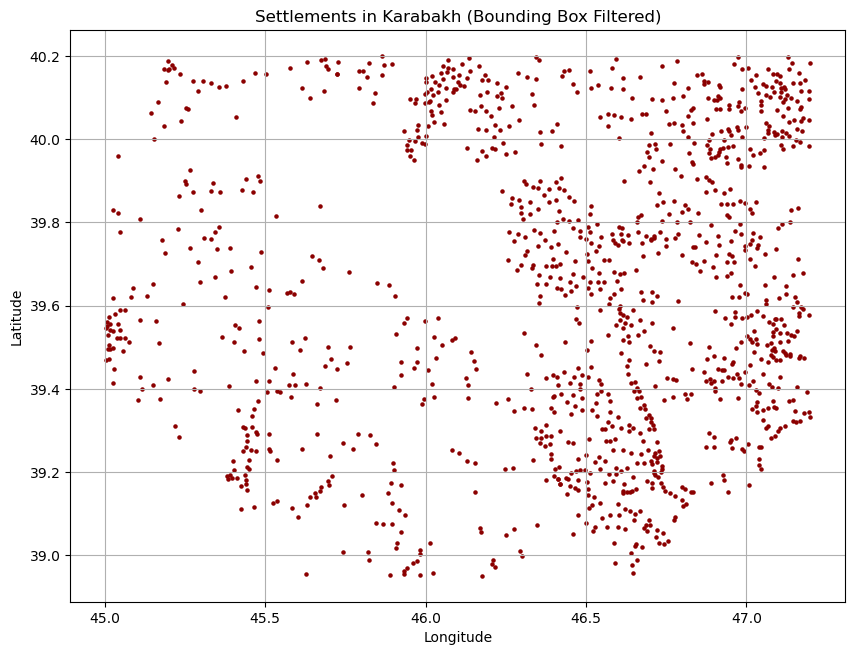

In [ ]:
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    karabakh_df,
    geometry=gpd.points_from_xy(karabakh_df.longitude, karabakh_df.latitude),
    crs="EPSG:4326"
)

# Plot
gdf.plot(figsize=(10, 10), color="darkred", markersize=5)
plt.title("Settlements in Karabakh (Bounding Box Filtered)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()

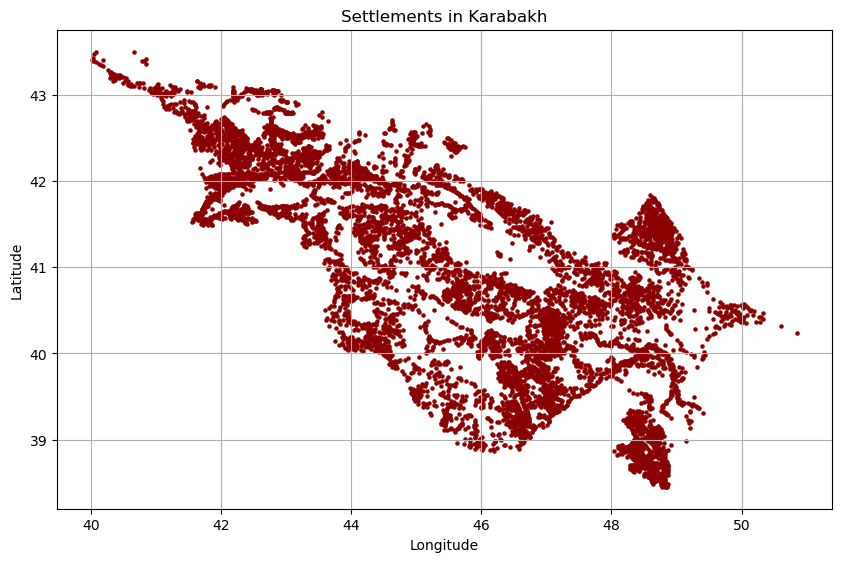

In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt

MIN_LAT = 38.95
MAX_LAT = 40.20
MIN_LON = 45.00
MAX_LON = 47.20


# 1. Load CSV with your settlements
# Make sure it has columns: name, latitude, longitude
df = pd.read_csv("C:/Users/ASUS/cleaned_with_coordinates.csv")

# 2. Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs="EPSG:4326"  # WGS84 - GPS coordinate system
)

# 3. Plot it using matplotlib
gdf.plot(figsize=(10, 10), color="darkred", markersize=5)
plt.title("Settlements in Karabakh")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# 1. Load your settlements
settlements = pd.read_csv("karabakh_settlements.csv")  # CSV must have 'latitude' and 'longitude'

# 2. Convert settlements to GeoDataFrame
settlements_gdf = gpd.GeoDataFrame(
    settlements,
    geometry=gpd.points_from_xy(settlements.longitude, settlements.latitude),
    crs="EPSG:4326"  # WGS84
)

# 3. Load building polygons from GeoJSON
buildings_gdf = gpd.read_file(
    "C:/Users/ASUS/Downloads/hotosm_aze_buildings_polygons_geojson/hotosm_aze_buildings_polygons_geojson.geojson"
)

# 4. Reproject both to a projected CRS for Azerbaijan (UTM zone 38N)
settlements_proj = settlements_gdf.to_crs("EPSG:32638")
buildings_proj = buildings_gdf.to_crs("EPSG:32638")

# 5. Buffer settlements by 500 meters (use projected CRS)
settlements_proj["buffer"] = settlements_proj.buffer(500)

# 6. Replace geometry with buffer for spatial join
settlement_buffers = settlements_proj.set_geometry("buffer")

# 7. Spatial join: buildings within buffer zones
buildings_joined = gpd.sjoin(buildings_proj, settlement_buffers, predicate="within", how="inner")

In [ ]:
buildings_joined

,name,name:en,building,building:levels,building:materials,addr:full,addr:housenumber,addr:street,addr:city,office,source,name:az,osm_id,osm_type,geometry,index_right,Name,longitude,latitude,geometry_right
142,None,None,yes,None,None,None,None,None,None,None,None,None,370536835,ways_poly,"POLYGON ((651788.388 4412294.02, 651799.55 441...",390,Khanbaghi,46.775220,39.851310,POINT (651864.806 4412762.114)
143,None,None,yes,None,None,None,None,None,None,None,None,None,370536830,ways_poly,"POLYGON ((651715.179 4412569.425, 651732.399 4...",390,Khanbaghi,46.775220,39.851310,POINT (651864.806 4412762.114)
144,None,None,yes,None,None,None,None,None,None,None,None,None,370536845,ways_poly,"POLYGON ((651762.141 4412413.756, 651777.732 4...",390,Khanbaghi,46.775220,39.851310,POINT (651864.806 4412762.114)
145,None,None,yes,None,None,None,None,None,None,None,None,None,370536849,ways_poly,"POLYGON ((651780.066 4412562.851, 651792.849 4...",390,Khanbaghi,46.775220,39.851310,POINT (651864.806 4412762.114)
146,None,None,yes,None,None,None,None,None,None,None,None,None,370536847,ways_poly,"POLYGON ((651809.884 4412731.447, 651826.178 4...",390,Khanbaghi,46.775220,39.851310,POINT (651864.806 4412762.114)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123058,Exchange,None,house,1,None,None,4,Aida İmanquliyeva küçəsi,Xankəndi,None,None,None,361539260,ways_poly,"POLYGON ((650374.466 4409007.549, 650377.364 4...",401,Khankandi,46.757362,39.820473,POINT (650404.279 4409309.162)
123059,None,None,yes,4,None,None,None,None,None,None,None,None,371314785,ways_poly,"POLYGON ((650094.339 4409687.44, 650098.614 44...",401,Khankandi,46.757362,39.820473,POINT (650404.279 4409309.162)
123712,Şuşa Real Məktəbi (1881-ci il),Shusha Real School (1881),school,3,None,None,1,Aslan Qaraşarov,Şuşa,None,None,Şuşa Real Məktəbi (1881-ci il),5755517,relations,"POLYGON ((649715.786 4402554.825, 649728.787 4...",405,Shusha,46.748816,39.759459,POINT (649805.196 4402522.563)
123839,None,None,yes,None,None,None,None,None,None,None,None,None,11150947,relations,"POLYGON ((650188.958 4409092.994, 650204.321 4...",401,Khankandi,46.757362,39.820473,POINT (650404.279 4409309.162)


In [ ]:
# 8. Count buildings per settlement
building_counts = buildings_joined.groupby("Name").size().reset_index(name="building_count")

# 9. Merge building counts back into original DataFrame
settlements_with_counts = settlements.merge(building_counts, on="Name", how="left")
settlements_with_counts["building_count"] = settlements_with_counts["building_count"].fillna(0).astype(int)

# 10. Save final result
settlements_with_counts.to_csv("karabakh_settlements_with_building_counts.csv", index=False)

print("✅ Done! Saved 'karabakh_settlements_with_building_counts.csv'")


✅ Done! Saved 'karabakh_settlements_with_building_counts.csv'


In [ ]:
settlements_with_counts.sort_values(by="building_count", ascending=False)

,Name,longitude,latitude,building_count
401,Khankandi,46.757362,39.820473,687
80,Khojavand,47.109643,39.795822,411
94,Khojavand,47.098415,39.786770,411
350,Askaran,46.833848,39.939480,313
502,Badara,46.666119,39.923380,307
...,...,...,...,...
506,Mirzalar,46.662519,39.778130,0
507,Bashkand,46.660223,39.802054,0
508,Sariyatag,46.659826,39.378630,0
509,Ishigli,46.658796,39.401386,0


In [ ]:
import geopandas as gpd
from shapely.geometry import Point

# 1. Load your GeoDataFrame
gdf = gpd.GeoDataFrame(
    settlements_with_counts,
    geometry=gpd.points_from_xy(settlements_with_counts.longitude, settlements_with_counts.latitude),
    crs="EPSG:4326"
)

# 2. Reproject to meters for distance calculations (UTM zone 38N)
gdf = gdf.to_crs("EPSG:32638")

# 3. Initialize an empty list for filtered rows
filtered_rows = []

# 4. Loop through each unique name and filter close duplicates
for name, group in gdf.groupby("Name"):
    temp = []
    used = set()
    group = group.reset_index(drop=True)
    
    for i, row in group.iterrows():
        if i in used:
            continue
        temp.append(row)
        p1 = row.geometry
        for j, other in group.iloc[i+1:].iterrows():
            p2 = other.geometry
            if p1.distance(p2) < 100:  # 100 meters threshold
                used.add(j)
    
    filtered_rows.extend(temp)

# 5. Convert filtered rows back to GeoDataFrame and original CRS
filtered_gdf = gpd.GeoDataFrame(filtered_rows, crs="EPSG:32638").to_crs("EPSG:4326")

# 6. Drop geometry if not needed
filtered_df = filtered_gdf.drop(columns=["geometry"])

# 7. Save result
filtered_df.to_csv("karabakh_settlements_deduplicated.csv", index=False)
print(f"✅ Final count: {len(filtered_df)} settlements (deduplicated)")

✅ Final count: 1238 settlements (deduplicated)


In [ ]:
filtered_df.sort_values(by="building_count", ascending=False)

,Name,longitude,latitude,building_count
0,Khankandi,46.757362,39.820473,687
1,Khojavand,47.098415,39.786770,411
0,Khojavand,47.109643,39.795822,411
0,Askaran,46.833848,39.939480,313
0,Badara,46.666119,39.923380,307
...,...,...,...,...
0,Goruglar,45.940463,38.968477,0
0,Gorus,46.344232,39.505241,0
0,Goshabulag,46.883050,39.294836,0
1,Goshabulag,45.792684,40.164416,0


In [ ]:
import pandas as pd
import folium

# 1. Load the data with building counts
df = pd.read_csv("karabakh_settlements_with_building_counts.csv")

# 2. Create a folium map centered on Karabakh
m = folium.Map(location=[39.8, 46.7], zoom_start=9, tiles="CartoDB positron")

# 3. Add settlement markers
for _, row in df.iterrows():
    popup_text = f"<b>{row['Name']}</b><br>Buildings: {int(row['building_count'])}"
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=max(3, row['building_count']**0.5 / 2),  # Scaled size
        color="crimson",
        fill=True,
        fill_color="crimson",
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(m)

# 4. Save or display
m.save("karabakh_building_map.html")
m

In [ ]:
# Load your GADM file (adjust path if needed)
azerbaijan_gdf = gpd.read_file("C:/Users/ASUS/Downloads/gadm41_AZE_0.json")  # or your file

# Convert to GeoJSON string for folium
azerbaijan_geojson = azerbaijan_gdf.to_json()

# Add country boundary
folium.GeoJson(
    azerbaijan_geojson,
    name="Azerbaijan",
    style_function=lambda feature: {
        "fillColor": "#ffffff00",  # transparent fill
        "color": "black",
        "weight": 1.5,
    }
).add_to(m)

In [ ]:
# Load GADM Level 1 (regions) if available
gadm_gdf = gpd.read_file("C:/Users/ASUS/Downloads/gadm41_AZE_1.json/gadm41_AZE_1.json")  # Level 1 = regions

# Remove Nakhchivan
gadm_gdf = gdf[~gdf["NAME_1"].str.contains("Nakhchivan", case=False)]

In [ ]:
# === 2. Remove Nakhchivan ===
gadm_mainland = gadm_gdf[~gadm_gdf["NAME_1"].str.contains("Nakhchivan", case=False)]

# === 3. Load your settlements with building counts ===
df = pd.read_csv("karabakh_settlements_with_building_counts.csv")

# === 4. Convert settlement DataFrame to GeoDataFrame ===
settlement_gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs="EPSG:4326"
)

# === 5. Keep only settlements inside mainland Azerbaijan ===
settlement_gdf = settlement_gdf[settlement_gdf.within(gadm_mainland.unary_union)]

# === 6. Create Folium Map ===
m = folium.Map(location=[39.8, 46.7], zoom_start=8, tiles="CartoDB positron")

# === 7. Add Azerbaijan boundary (without Nakhchivan) ===
folium.GeoJson(
    gadm_mainland.to_json(),
    name="Mainland Azerbaijan",
    style_function=lambda feature: {
        "fillColor": "#ffffff00",  # transparent fill
        "color": "black",
        "weight": 1.5,
    }
).add_to(m)

# === 8. Add settlement markers ===
for _, row in settlement_gdf.iterrows():
    popup_text = f"<b>{row['Name']}</b><br>Buildings: {int(row['building_count'])}"
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=max(3, row['building_count']**0.5 / 2),
        color="crimson",
        fill=True,
        fill_color="crimson",
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(m)

# === 9. Save and display ===
m.save("karabakh_building_map_without_nakhchivan.html")
m

C:\Users\ASUS\AppData\Local\Temp\ipykernel_25252\3563441661.py:15: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  settlement_gdf = settlement_gdf[settlement_gdf.within(gadm_mainland.unary_union)]


In [ ]:
m

In [ ]:
import geopandas as gpd
import numpy as np
from shapely.geometry import box

# 1. Load building polygons (Azerbaijan full)
buildings = gpd.read_file("C:/Users/ASUS/Downloads/hotosm_aze_buildings_polygons_geojson/hotosm_aze_buildings_polygons_geojson.geojson")
buildings = buildings.to_crs("EPSG:4326")  # Make sure it's in lat/lon

# 2. Define Karabakh bounding box (conflict region)
karabakh_bbox = box(45.00, 38.95, 47.20, 40.30)
karabakh_gdf = gpd.GeoDataFrame(geometry=[karabakh_bbox], crs="EPSG:4326")

# 3. Clip buildings to Karabakh area
buildings_karabakh = gpd.overlay(buildings, karabakh_gdf, how="intersection")

# 4. Reproject to meters for spatial operations
buildings_karabakh = buildings_karabakh.to_crs("EPSG:32638")

# 5. Create 5×5 km grid over Karabakh bounding box
minx, miny, maxx, maxy = buildings_karabakh.total_bounds
grid_size = 5000  # 5 km
grid_cells = []
for x in np.arange(minx, maxx + grid_size, grid_size):
    for y in np.arange(miny, maxy + grid_size, grid_size):
        grid_cells.append(box(x, y, x + grid_size, y + grid_size))
grid = gpd.GeoDataFrame(geometry=grid_cells, crs="EPSG:32638")

# 6. Spatial join: count buildings per grid cell
join = gpd.sjoin(buildings_karabakh, grid, predicate="within", how="inner")
counts = join.groupby("index_right").size().reset_index(name="building_count")
grid["building_count"] = counts.set_index("index_right")["building_count"].fillna(0)

# 7. Select densest grid cells summing to ~500 km²
grid["area_km2"] = grid.area / 1e6
grid_sorted = grid.sort_values(by="building_count", ascending=False)

selected = []
total_area = 0
for _, row in grid_sorted.iterrows():
    if total_area + row["area_km2"] <= 500:
        selected.append(row)
        total_area += row["area_km2"]
    else:
        break

selected_grid = gpd.GeoDataFrame(selected, crs="EPSG:32638")
selected_grid.to_file("karabakh_densest_500km2.geojson", driver="GeoJSON")

print(f"✅ Done: Selected {len(selected_grid)} grid cells totaling ~{total_area:.1f} km² in Karabakh")


✅ Done: Selected 20 grid cells totaling ~500.0 km² in Karabakh


In [ ]:
# Reproject for web map
selected_latlon = selected_grid.to_crs("EPSG:4326")

m = folium.Map(location=[39.9, 46.8], zoom_start=9, tiles="CartoDB positron")
folium.GeoJson(selected_latlon).add_to(m)
m.save("karabakh_densest_500km2.html")
m

In [ ]:
# Reproject to EPSG:4326 for KML (lat/lon)
selected_grid_wgs84 = selected_grid.to_crs("EPSG:4326")

# Save as KML
selected_grid_wgs84.to_file("karabakh_densest_500.kml", driver="KML")


In [ ]:
import zipfile

with zipfile.ZipFile("karabakh_densest_500.kmz", "w", zipfile.ZIP_DEFLATED) as kmz:
    kmz.write("karabakh_densest_500.kml")


In [ ]:
import geopandas as gpd
from shapely.geometry import box
import folium

# 1. Load your grid (already in EPSG:32638)
grid_proj = selected_grid.to_crs("EPSG:32638")  # Projected in meters

# 2. Find the densest grid cell
densest_cell = grid_proj.sort_values("building_count", ascending=False).iloc[0]
centroid = densest_cell.geometry.centroid

# 3. Define the size of the rectangle (500 km² = 25x20 km)
half_width = 12500  # 12.5 km
half_height = 10000  # 10 km
x, y = centroid.x, centroid.y
rect = box(x - half_width, y - half_height, x + half_width, y + half_height)

# 4. Wrap in GeoDataFrame
rect_gdf = gpd.GeoDataFrame(index=[0], geometry=[rect], crs="EPSG:32638")

# 5. Reproject to WGS84 for folium
rect_latlon = rect_gdf.to_crs("EPSG:4326")
centroid_latlon = gpd.GeoSeries([centroid], crs="EPSG:32638").to_crs("EPSG:4326").iloc[0]

# 6. Create folium map
m = folium.Map(location=[centroid_latlon.y, centroid_latlon.x], zoom_start=11, tiles="CartoDB positron")

# 7. Add the rectangle
folium.GeoJson(rect_latlon).add_to(m)

# 8. Save or display
m.save("karabakh_500km2_box.html")
m


In [ ]:
rect_wgs84 = rect_gdf.to_crs("EPSG:4326")
rect_wgs84.to_file("karabakh_box.kml", driver="KML")
import zipfile

with zipfile.ZipFile("karabakh_box.kmz", "w", zipfile.ZIP_DEFLATED) as kmz:
    kmz.write("karabakh_box.kml")


In [ ]:
m

In [56]:
import geopandas as gpd
import rasterio
from rasterio.mask import mask
import matplotlib.pyplot as plt
import json

# --- Step 1: Load the DEM Raster ---
dem_path = "C:/Users/ASUS/Downloads/rasters_COP30/output_hh.tif"  # replace with actual path
src = rasterio.open(dem_path)

# --- Step 2: Load Karabakh Polygon (GeoJSON or Shapefile) ---
karabakh_gdf = gpd.read_file("C:/Users/ASUS/Downloads/gadm41_AZE_1.json/gadm41_AZE_1.json")  # or .shp

# Ensure both use the same CRS
karabakh_gdf = karabakh_gdf.to_crs(src.crs)

# --- Step 3: Clip DEM with Karabakh Polygon ---
# Convert geometry to GeoJSON-like dict
karabakh_geom = [json.loads(karabakh_gdf.to_json())['features'][0]['geometry']]



In [58]:
from shapely.geometry import box
import geopandas as gpd

with rasterio.open(dem_path) as src:
    # 2. Get raster bounds and convert to a geometry
    raster_bounds_geom = box(*src.bounds)
    
    # 3. Print bounds
    print("Raster bounds:", raster_bounds_geom.bounds)
    
# Raster bounds as a box
raster_bounds_geom = box(*src.bounds)

# 5. Ensure both are in the same CRS
karabakh_gdf = karabakh_gdf.to_crs("EPSG:4326")

# 6. Check Karabakh bounds
print("Karabakh bounds:", karabakh_gdf.total_bounds)

# 7. Check for intersection
intersects = raster_bounds_geom.intersects(karabakh_gdf.unary_union)
print("Do they intersect?:", intersects)

Raster bounds: (45.49152776666668, 38.79569445555555, 47.94513887777779, 40.47930556666666)
Karabakh bounds: [44.7726 38.3972 50.6078 41.9075]
Do they intersect?: True


C:\Users\ASUS\AppData\Local\Temp\ipykernel_37464\1783739770.py:21: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  intersects = raster_bounds_geom.intersects(karabakh_gdf.unary_union)


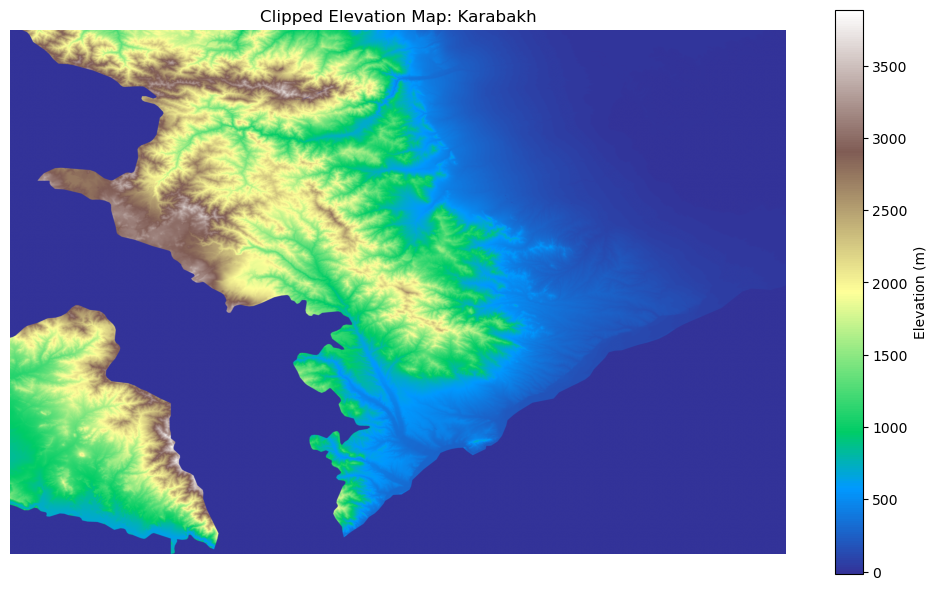

In [64]:
# Load DEM
dem_path = "C:/Users/ASUS/Downloads/rasters_COP30/output_hh.tif"
src = rasterio.open(dem_path)
dem_bounds = box(*src.bounds)

karabakh_gdf = gpd.read_file("C:/Users/ASUS/Downloads/gadm41_AZE_1.json/gadm41_AZE_1.json")
karabakh_gdf = karabakh_gdf.to_crs(src.crs)

# 3. Filter geometries that actually intersect the DEM
karabakh_gdf = karabakh_gdf[karabakh_gdf.geometry.intersects(dem_bounds)]

# Check if anything remains
if karabakh_gdf.empty:
    raise ValueError("No polygons intersect the DEM area. Check file content.")

# 4. Convert geometry to list of GeoJSON dicts
geoms = [json.loads(karabakh_gdf.to_json())['features'][i]['geometry'] for i in range(len(karabakh_gdf))]

# 5. Clip the DEM
out_image, out_transform = mask(src, geoms, crop=True)
out_meta = src.meta.copy()
out_meta.update({
    "driver": "GTiff",
    "height": out_image.shape[1],
    "width": out_image.shape[2],
    "transform": out_transform
})

# 6. Save clipped raster
with rasterio.open("clipped_karabakh_dem_new.tif", "w", **out_meta) as dest:
    dest.write(out_image)

# 7. Visualize
plt.figure(figsize=(10, 6))
plt.imshow(out_image[0], cmap="terrain")
plt.colorbar(label="Elevation (m)")
plt.title("Clipped Elevation Map: Karabakh")
plt.axis('off')
plt.tight_layout()
plt.show()

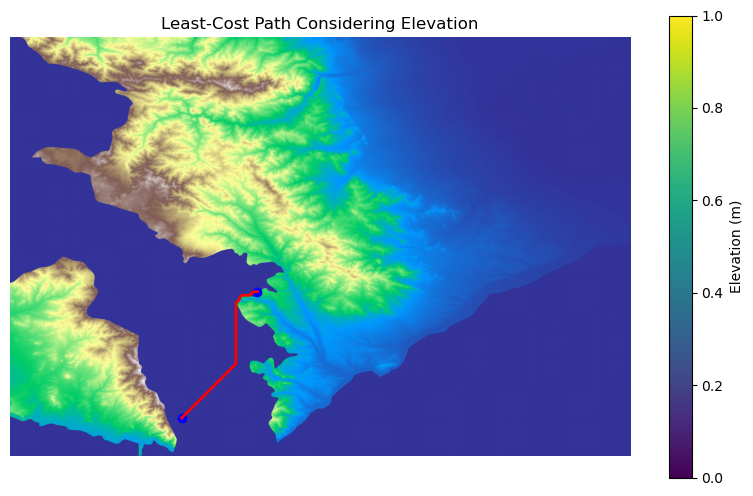

In [66]:
from shapely.geometry import Point
import numpy as np
from scipy.ndimage import sobel
from skimage.graph import route_through_array
from rasterio.transform import xy

# Use actual coordinates in DEM's CRS
start = Point(46.5, 39.5)  # example longitude, latitude
end = Point(47.0, 39.8)

# Load elevation data
elevation = out_image[0]  # Assuming already clipped and loaded

# Handle nodata
elevation[elevation == src.nodata] = np.nan

# Calculate slope using Sobel filters
sx = sobel(elevation, axis=1, mode='nearest')  # horizontal gradient
sy = sobel(elevation, axis=0, mode='nearest')  # vertical gradient
slope = np.hypot(sx, sy)  # magnitude of gradient

# Define cost as slope + small constant to avoid zero
cost = np.nan_to_num(slope, nan=1000) + 1

row_start, col_start = ~out_transform * (start.x, start.y)
row_end, col_end = ~out_transform * (end.x, end.y)

start_idx = (int(row_start), int(col_start))
end_idx = (int(row_end), int(col_end))

indices, weight = route_through_array(
    cost,
    start_idx,
    end_idx,
    fully_connected=True,  # 8-neighbor connectivity
    geometric=True
)
path_rows, path_cols = zip(*indices)


path_coords = [xy(out_transform, r, c) for r, c in indices]
plt.figure(figsize=(10, 6))
plt.imshow(elevation, cmap='terrain')
plt.plot(path_cols, path_rows, color='red', linewidth=2)
plt.scatter([col_start, col_end], [row_start, row_end], color='blue')
plt.title("Least-Cost Path Considering Elevation")
plt.colorbar(label="Elevation (m)")
plt.axis('off')
plt.show()

In [ ]:
import rasterio
import geopandas as gpd
import pandas as pd

# 1. Load settlements (with Point geometry)
settlements_gdf = gpd.GeoDataFrame(
    settlements,
    geometry=gpd.points_from_xy(settlements.longitude, settlements.latitude),
    crs="EPSG:4326"  # WGS84
)  # or .csv converted to GeoDataFrame
settlements_gdf = settlements_gdf.to_crs("EPSG:4326")  # match DEM CRS

# 2. Open DEM
with rasterio.open("clipped_karabakh_dem.tif") as dem:
    # 3. Prepare (lon, lat) tuples
    coords = [(point.x, point.y) for point in settlements_gdf.geometry]
    
    # 4. Sample elevation at each point
    elevations = list(dem.sample(coords))
    settlements_gdf["elevation"] = [val[0] if val else None for val in elevations]

# 5. Save result
settlements_gdf.to_file("karabakh_settlements_with_elevation.geojson", driver="GeoJSON")
settlements_gdf.to_csv("karabakh_settlements_with_elevation.csv", index=False)

In [ ]:
from geopy.distance import geodesic
import numpy as np

# Load your settlements CSV (must include latitude, longitude, elevation)
df = pd.read_csv("karabakh_settlements_with_elevation.csv")

# Prepare output for slopes
edges = []

# Loop over all unique settlement pairs
for i, row_i in df.iterrows():
    for j, row_j in df.iterrows():
        if i >= j:
            continue  # skip self-pairs and duplicates

        # Coordinates and elevation
        coord_i = (row_i['latitude'], row_i['longitude'])
        coord_j = (row_j['latitude'], row_j['longitude'])
        elev_i = row_i['elevation']
        elev_j = row_j['elevation']

        # Compute horizontal distance (in meters)
        distance_m = geodesic(coord_i, coord_j).meters

        # Compute elevation difference
        elev_diff = elev_j - elev_i

        # Compute slope in percent
        if distance_m > 0:
            slope_percent = (elev_diff / distance_m) * 100
        else:
            slope_percent = 0

        # Save as edge
        edges.append({
            'from': row_i['Name'],  # or row_i['id']
            'to': row_j['Name'],
            'distance_m': distance_m,
            'elevation_diff': elev_diff,
            'slope_percent': slope_percent,
            'abs_slope_percent': abs(slope_percent)
        })

# Save result as DataFrame
edges_df = pd.DataFrame(edges)
edges_df.to_csv("settlement_pairwise_slopes.csv", index=False)

print("✅ Pairwise slope table saved.")



✅ Pairwise slope table saved.


In [ ]:
import pandas as pd

# Load both files
df_buildings = pd.read_csv("karabakh_settlements_deduplicated.csv")
df_elevation = pd.read_csv("karabakh_settlements_with_elevation.csv")

# Round coordinates to 6 decimals to avoid float mismatch
df_buildings['latitude'] = df_buildings['latitude'].round(6)
df_buildings['longitude'] = df_buildings['longitude'].round(6)
df_elevation['latitude'] = df_elevation['latitude'].round(6)
df_elevation['longitude'] = df_elevation['longitude'].round(6)

# Merge on lat/lon
df_merged = pd.merge(
    df_buildings,
    df_elevation[['latitude', 'longitude', 'elevation']],
    on=['latitude', 'longitude'],
    how='inner'
)

# Save result
df_merged.to_csv("karabakh_settlements_with_building_and_elevation.csv", index=False)
print("✅ Merged file saved as karabakh_settlements_with_building_and_elevation.csv")


✅ Merged file saved as karabakh_settlements_with_building_and_elevation.csv


In [ ]:
import pandas as pd
import numpy as np
import networkx as nx
from tqdm import tqdm

# Load settlements with building count
nodes_df = pd.read_csv("karabakh_settlements_with_building_and_elevation.csv")

# Add node weight: log(1 + buildings)
nodes_df['node_weight'] = np.log1p(nodes_df['building_count'])

# Load pairwise connections (edges with slope + distance)
edges_df = pd.read_csv("settlement_pairwise_slopes.csv")

# Merge node weights to each edge (both ends)
edges_df = edges_df.merge(nodes_df[['Name', 'node_weight']], left_on='from', right_on='Name')
edges_df = edges_df.rename(columns={'node_weight': 'weight_from'})
edges_df = edges_df.merge(nodes_df[['Name', 'node_weight']], left_on='to', right_on='Name')
edges_df = edges_df.rename(columns={'node_weight': 'weight_to'})
edges_df.drop(columns=['Name_x', 'Name_y'], inplace=True)

# Define cost function: distance * (1 + slope%) - α * average node weight
alpha = 100
edges_df['cost'] = (
    edges_df['distance_m'] * (1 + edges_df['abs_slope_percent'] / 100)
    - alpha * (edges_df['weight_from'] + edges_df['weight_to']) / 2
)

# Build graph
G = nx.Graph()

# Add nodes
for _, row in nodes_df.iterrows():
    G.add_node(row['Name'], pos=(row['longitude'], row['latitude']), weight=row['node_weight'])

# Add edges with cost
for _, row in tqdm(edges_df.iterrows(), total=len(edges_df), desc="Building graph"):
    G.add_edge(row['from'], row['to'], weight=row['cost'], distance=row['distance_m'], slope=row['abs_slope_percent'])

# Choose start and end nodes (top 2 most populated)
top_nodes = nodes_df.sort_values('building_count', ascending=False).head(2)
start_node = top_nodes.iloc[0]['Name']
end_node = top_nodes.iloc[1]['Name']

print(f"Start: {start_node} → End: {end_node}")

# Run Dijkstra to find optimal path
print("Running Dijkstra's algorithm...")
shortest_path = nx.dijkstra_path(G, source=start_node, target=end_node, weight='weight')

# Extract edge data for that path
path_edges = list(zip(shortest_path[:-1], shortest_path[1:]))
path_info = []
total_cost = 0
total_distance = 0

for u, v in path_edges:
    data = G.get_edge_data(u, v)
    path_info.append({
        'from': u,
        'to': v,
        'distance_m': data['distance'],
        'slope_percent': data['slope'],
        'cost': data['weight']
    })
    total_cost += data['weight']
    total_distance += data['distance']

# Save output
path_df = pd.DataFrame(path_info)
path_df.to_csv("optimal_railway_path.csv", index=False)

print("✅ Path saved to optimal_railway_path.csv")
print(f"Total cost: {total_cost:.2f} | Total distance: {total_distance / 1000:.2f} km")
print("Path:", " → ".join(shortest_path))


Building graph: 100%|██████████| 1325233/1325233 [01:15<00:00, 17521.37it/s]


Start: Khankandi → End: Khojavand
Running Dijkstra's algorithm...
✅ Path saved to optimal_railway_path.csv
Total cost: 29052.94 | Total distance: 29.63 km
Path: Khankandi → Malibayli → Garitapa → Khojavand


In [9]:
import pandas as pd
import numpy as np
import networkx as nx
from tqdm import tqdm
# Load nodes
nodes_df = pd.read_csv("settlements_without_nakhchivan.csv")
nodes_df = nodes_df[nodes_df['building_count'] > 0].copy()

# Compute node weight = log(1 + building_count)
nodes_df['node_weight'] = np.log1p(nodes_df['building_count'])


In [7]:
nodes_df.sort_values(by="building_count", ascending=False)

,Name,longitude,latitude,building_count,elevation,node_weight
423,Khankandi,46.757362,39.820473,687,821.001587,6.533789
436,Khojavand,47.109643,39.795822,411,395.033325,6.021023
437,Khojavand,47.098415,39.786770,411,387.797760,6.021023
81,Askaran,46.833848,39.939480,313,512.783020,5.749393
89,Badara,46.666118,39.923380,307,906.416382,5.730100
...,...,...,...,...,...,...
556,Razdara,46.566458,39.066956,1,586.411682,0.693147
56,Arakul,46.994839,39.439561,1,803.493225,0.693147
642,Taghaverd,46.906439,39.668870,1,967.382385,0.693147
463,Mahrizli,47.060966,40.039583,1,217.310013,0.693147


In [10]:

# Load pairwise edge data
edges_df = pd.read_csv("settlement_pairwise_slopes.csv")

# Filter to only keep edges between settlements that exist in our filtered nodes list
valid_names = set(nodes_df['Name'])
edges_df = edges_df[edges_df['from'].isin(valid_names) & edges_df['to'].isin(valid_names)]

# Merge node weights to calculate cost
edges_df = edges_df.merge(nodes_df[['Name', 'node_weight']], left_on='from', right_on='Name')
edges_df = edges_df.rename(columns={'node_weight': 'weight_from'}).drop(columns='Name')

edges_df = edges_df.merge(nodes_df[['Name', 'node_weight']], left_on='to', right_on='Name')
edges_df = edges_df.rename(columns={'node_weight': 'weight_to'}).drop(columns='Name')


In [11]:
# Calculate edge cost
alpha = 100  # weight influence multiplier
edges_df['cost'] = (
    edges_df['distance_m'] * (1 + edges_df['abs_slope_percent'] / 100)
    - alpha * (edges_df['weight_from'] + edges_df['weight_to']) / 2
)
edges_df = edges_df.dropna(subset=['abs_slope_percent', 'distance_m', 'cost'])
# Build graph
G = nx.Graph()

# Add nodes
for _, row in nodes_df.iterrows():
    G.add_node(
    row['Name'],
    pos=(row['longitude'], row['latitude']),
    weight=row['node_weight'],  # keep if used elsewhere
    building_count=row['building_count']  # this is what hub logic needs
)

# Add edges
for _, row in tqdm(edges_df.iterrows(), total=len(edges_df), desc="Building graph"):
    G.add_edge(row['from'], row['to'], weight=row['cost'], distance=row['distance_m'], slope=row['abs_slope_percent'])

# Compute Minimum Spanning Tree
print("⏳ Computing MST...")
# Drop rows with NaN in slope or cost or distance
mst = nx.minimum_spanning_tree(G, weight='weight')
print(f"✅ MST contains {len(mst.nodes)} nodes and {len(mst.edges)} edges.")

# Save MST edges to CSV
mst_data = []
for u, v, data in mst.edges(data=True):
    mst_data.append({
        'from': u,
        'to': v,
        'distance_m': data['distance'],
        'slope_percent': data['slope'],
        'cost': data['weight']
    })

mst_df = pd.DataFrame(mst_data)
mst_df.to_csv("optimal_railway_network.csv", index=False)
print("📁 Saved optimal railway network to optimal_railway_network.csv")

Building graph: 100%|██████████| 59849/59849 [00:03<00:00, 17534.12it/s]


⏳ Computing MST...
✅ MST contains 206 nodes and 205 edges.
📁 Saved optimal railway network to optimal_railway_network.csv


In [27]:
import pandas as pd
import folium

# Load settlement info
nodes_df = pd.read_csv("settlements_without_nakhchivan.csv")
nodes_df = nodes_df[nodes_df['building_count'] > 0].copy()
name_to_coords = dict(zip(nodes_df['Name'], zip(nodes_df['latitude'], nodes_df['longitude'])))

# Load MST edges
edges_df = pd.read_csv("optimal_railway_network.csv")

# Initialize map
m = folium.Map(location=[39.8, 46.8], zoom_start=9, tiles="CartoDB positron")

# Plot settlements
for _, row in nodes_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=max(3, row['building_count']**0.5 / 2),
        color="crimson",
        fill=True,
        fill_opacity=0.8,
        popup=folium.Popup(f"{row['Name']}<br>Buildings: {row['building_count']}", max_width=300)
    ).add_to(m)

# Plot railway edges
for _, row in edges_df.iterrows():
    if row['from'] in name_to_coords and row['to'] in name_to_coords:
        loc1 = name_to_coords[row['from']]
        loc2 = name_to_coords[row['to']]
        folium.PolyLine(
            locations=[loc1, loc2],
            color="blue",
            weight=3,
            opacity=0.6,
            tooltip=f"{row['from']} → {row['to']}<br>Dist: {row['distance_m']:.0f} m<br>Slope: {row['slope_percent']:.2f}%",
        ).add_to(m)

# Save map
m.save("optimal_railway_network_map.html")
print("✅ Map saved to optimal_railway_network_map.html")
m


✅ Map saved to optimal_railway_network_map.html


In [55]:
import pandas as pd
import numpy as np
import folium
from folium import FeatureGroup, LayerControl
from folium.plugins import MousePosition

# Load data
nodes_df = pd.read_csv("settlements_without_nakhchivan.csv")
nodes_df = nodes_df[nodes_df['building_count'] > 0].copy()
edges_df = pd.read_csv("optimal_railway_network.csv")
name_to_coords = dict(zip(nodes_df['Name'], zip(nodes_df['latitude'], nodes_df['longitude'])))

# Create map
m = folium.Map(
    location=[39.8, 46.8],
    zoom_start=9,
    tiles="OpenTopoMap",  # try "Stamen Toner", "OpenStreetMap", etc.
    control_scale=True
)

# Create feature groups for each category
hubs_layer = FeatureGroup(name="Top Hubs").add_to(m)
very_large_layer = FeatureGroup(name="Very Large Settlements (>75%)").add_to(m)
large_layer = FeatureGroup(name="Large Settlements (50–75%)").add_to(m)
medium_layer = FeatureGroup(name="Medium Settlements (25–50%)").add_to(m)
small_layer = FeatureGroup(name="Small Settlements (≤25%)").add_to(m)
railway_layer = FeatureGroup(name="Railway Edges").add_to(m)

# Identify top 5 hubs
top_hubs = nodes_df.nlargest(5, 'building_count')['Name'].tolist()

# Compute percentiles for non-hubs
non_hub_counts = nodes_df[~nodes_df['Name'].isin(top_hubs)]['building_count']
p25, p50, p75 = np.percentile(non_hub_counts, [25, 50, 75])

# Plot settlements
for _, row in nodes_df.iterrows():
    name = row['Name']
    count = row['building_count']
    coord = [row['latitude'], row['longitude']]
    popup = folium.Popup(f"{name}<br>Buildings: {count}", max_width=300)

    if name in top_hubs:
        folium.CircleMarker(
            location=coord,
            radius=10,
            color="green",
            fill=True,
            fill_opacity=0.8,
            popup=popup
        ).add_to(hubs_layer)

    elif count <= p25:
        folium.CircleMarker(
            location=coord,
            radius=3,
            color="#8e44ad",  # purple
            fill=True,
            fill_opacity=0.8,
            popup=popup
        ).add_to(small_layer)

    elif count <= p50:
        folium.CircleMarker(
            location=coord,
            radius=4,
            color="#f1c40f",  # yellow
            fill=True,
            fill_opacity=0.8,
            popup=popup
        ).add_to(medium_layer)

    elif count <= p75:
        folium.CircleMarker(
            location=coord,
            radius=5,
            color="#e67e22",  # orange
            fill=True,
            fill_opacity=0.8,
            popup=popup
        ).add_to(large_layer)

    else:
        folium.CircleMarker(
            location=coord,
            radius=6,
            color="#c0392b",  # red
            fill=True,
            fill_opacity=0.8,
            popup=popup
        ).add_to(very_large_layer)

# Plot railway edges
for _, row in edges_df.iterrows():
    if row['from'] in name_to_coords and row['to'] in name_to_coords:
        loc1 = name_to_coords[row['from']]
        loc2 = name_to_coords[row['to']]
        folium.PolyLine(
            locations=[loc1, loc2],
            color="blue",
            weight=3,
            opacity=0.6,
            tooltip=f"{row['from']} → {row['to']}<br>Dist: {row['distance_m']:.0f} m<br>Slope: {row['slope_percent']:.2f}%"
        ).add_to(railway_layer)

# Add tools
MousePosition().add_to(m)
LayerControl(collapsed=False).add_to(m)

# Save map
m.save("optimal_railway_network_map.html")
print("✅ Map saved to optimal_railway_network_map.html")
m

✅ Map saved to optimal_railway_network_map.html


In [42]:
m = folium.Map(
    location=[39.8, 46.8],
    zoom_start=9,
    tiles="OpenStreetMap",  # try "Stamen Toner", "OpenStreetMap", etc.
    control_scale=True
)

color = "blue" if row["slope_percent"] < 4 else "red"
weight = 2 if row["distance_m"] < 10000 else 3

m

In [30]:
import pandas as pd
import numpy as np
import os
import folium
from folium import FeatureGroup, LayerControl
from folium.plugins import MousePosition

# Load settlement info
nodes_df = pd.read_csv("settlements_without_nakhchivan.csv")
nodes_df = nodes_df[nodes_df['building_count'] > 0].copy()

m = folium.Map(location=[39.8, 46.8], zoom_start=9, tiles="CartoDB positron", control_scale=True)

# Map names to coordinates
name_to_coords = dict(zip(nodes_df['Name'], zip(nodes_df['latitude'], nodes_df['longitude'])))

# Load MST edges
edges_df = pd.read_csv("optimal_railway_network.csv")

# Identify top 5 hubs by building count
top_hubs = nodes_df.nlargest(5, 'building_count')['Name'].tolist()

# Function to scale marker radius
def scale_radius(building_count):
    return max(2.5, np.log1p(building_count) * 1.2)

# Create separate layers
hubs_layer = FeatureGroup(name="Top Hubs").add_to(m)
settlements_layer = FeatureGroup(name="All Settlements").add_to(m)
railway_layer = FeatureGroup(name="Railway Edges").add_to(m)

# Add markers
for _, row in nodes_df.iterrows():
    radius = scale_radius(row['building_count'])
    popup = folium.Popup(f"{row['Name']}<br>Buildings: {row['building_count']}", max_width=300)

    marker = folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=radius,
        color="green" if row['Name'] in top_hubs else "crimson",
        fill=True,
        fill_opacity=0.8,
        popup=popup
    )

    if row['Name'] in top_hubs:
        marker.add_to(hubs_layer)
    else:
        marker.add_to(settlements_layer)

# Add railway edges
for _, row in edges_df.iterrows():
    if row['from'] in name_to_coords and row['to'] in name_to_coords:
        loc1 = name_to_coords[row['from']]
        loc2 = name_to_coords[row['to']]
        folium.PolyLine(
            locations=[loc1, loc2],
            color="blue",
            weight=3,
            opacity=0.6,
            tooltip=f"{row['from']} → {row['to']}<br>Dist: {row['distance_m']:.0f} m<br>Slope: {row['slope_percent']:.2f}%"
        ).add_to(railway_layer)

# Add UI tools
MousePosition().add_to(m)
LayerControl(collapsed=False).add_to(m)



In [31]:
m

In [133]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# 1. Load settlements CSV into GeoDataFrame
df = pd.read_csv("karabakh_settlements_with_building_and_elevation.csv")
gdf_settlements = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.longitude, df.latitude),
    crs="EPSG:4326"
)

# 2. Load Azerbaijan Admin Level 1 boundaries
gdf_admin = gpd.read_file("C:/Users/ASUS/Downloads/gadm41_AZE_1.json/gadm41_AZE_1.json")

# 3. Exclude Nakhchivan by checking the NAME_1 field
print(gdf_admin["NAME_1"].unique())  # Uncomment to inspect actual names
mainland_admin = gdf_admin[gdf_admin["NAME_1"] != "Nakhchivan"]  # Adjust if needed

# 4. Buffer inward by 2km to avoid settlements near the international border
mainland_admin_proj = mainland_admin.to_crs(epsg=32638)
mainland_buffered_proj = mainland_admin_proj.buffer(-2000)

# Reproject buffered polygon back to WGS84
mainland_buffered = gpd.GeoDataFrame(geometry=mainland_buffered_proj).set_crs(epsg=32638).to_crs(epsg=4326)

# 5. Filter settlements: keep only those within mainland buffered polygon
settlements_mainland = gdf_settlements[gdf_settlements.geometry.within(mainland_buffered.unary_union)]

# 6. Save filtered settlements (excluding Nakhchivan & near-border ones)
settlements_mainland.drop(columns=["geometry"]).to_csv("settlements_without_nakhchivan.csv", index=False)

['Absheron' 'Aran' 'Daglig-Shirvan' 'Ganja-Qazakh' 'Kalbajar-Lachin'
 'Lankaran' 'Nakhchivan' 'Quba-Khachmaz' 'Shaki-Zaqatala'
 'Yukhari-Karabakh']


C:\Users\ASUS\AppData\Local\Temp\ipykernel_25252\4287095000.py:28: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  settlements_mainland = gdf_settlements[gdf_settlements.geometry.within(mainland_buffered.unary_union)]


In [13]:
import networkx as nx
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# Step 1: Compute centrality metrics
betweenness = nx.betweenness_centrality(G, weight='weight')  # weighted by edge weights
degree = dict(G.degree())

# Step 2: Extract building counts
building_counts = nx.get_node_attributes(G, 'building_count')

# Combine into DataFrame
df_hubs = pd.DataFrame({
    "name": list(G.nodes),
    "building_count": [building_counts.get(n, 0) for n in G.nodes],
    "betweenness": [betweenness.get(n, 0) for n in G.nodes],
    "degree": [degree.get(n, 0) for n in G.nodes]
})

# Step 3: Normalize all metrics
scaler = MinMaxScaler()
df_hubs[['building_count_norm', 'betweenness_norm', 'degree_norm']] = scaler.fit_transform(
    df_hubs[['building_count', 'betweenness', 'degree']]
)

# Step 4: Weighted hub score
df_hubs['hub_score'] = (
    0.5 * df_hubs['building_count_norm'] +
    0.3 * df_hubs['betweenness_norm'] +
    0.2 * df_hubs['degree_norm']
)

# Step 5: Sort and select top N hubs
df_hubs = df_hubs.sort_values(by='hub_score', ascending=False)
top_hubs = df_hubs.head(10)  # or change to top_n = 15, etc.

# Print or export
print(top_hubs[['name', 'building_count', 'betweenness', 'degree', 'hub_score']])
top_hub_names = set(top_hubs['name'])


                   name  building_count  betweenness  degree  hub_score
122           Khankandi             687     0.098231     205   0.791348
127           Khojavand             411     0.001196     207   0.502380
31              Ballija             279     0.088953     205   0.466454
27               Badara             307     0.075275     205   0.446294
23              Askaran             313     0.073314     205   0.444852
125           Khanyurdu             267     0.082018     205   0.437140
79            Gayabashi             161     0.101148     205   0.416618
176              Shusha             297     0.048828     205   0.360566
20   Ashaghi Gilichbagh             246     0.057293     205   0.348501
57            Dashbulag             183     0.000000     207   0.332653


In [19]:
edge_betweenness = nx.edge_betweenness_centrality(G, weight='weight')
nx.set_edge_attributes(G, edge_betweenness, 'edge_betweenness')

for u, v, data in G.edges(data=True):
    b1 = G.nodes[u].get('building_count', 0)
    b2 = G.nodes[v].get('building_count', 0)
    data['combined_building_count'] = b1 + b2

# Extract values
eb = np.array([d['edge_betweenness'] for _, _, d in G.edges(data=True)])
bc = np.array([d['combined_building_count'] for _, _, d in G.edges(data=True)])

# Normalize
eb_norm = (eb - eb.min()) / (eb.max() - eb.min())
bc_norm = (bc - bc.min()) / (bc.max() - bc.min())

# Combine into route score
for i, (u, v, d) in enumerate(G.edges(data=True)):
    d['route_score'] = 0.6 * eb_norm[i] + 0.4 * bc_norm[i]

# Sort and label top edges
top_edges = sorted(G.edges(data=True), key=lambda x: x[2]['route_score'], reverse=True)[:20]

# Label
for u, v, d in top_edges:
    d['is_critical'] = True


In [ ]:
# Add all edges (thin gray)
for u, v, d in G.edges(data=True):
    pos_u = G.nodes[u]['pos']
    pos_v = G.nodes[v]['pos']
    folium.PolyLine(
        locations=[(pos_u[1], pos_u[0]), (pos_v[1], pos_v[0])],  # lat, lon
        color="gray",
        weight=1,
        opacity=0.5
    ).add_to(m)

# Add critical edges (thick red)
for u, v, d in G.edges(data=True):
    if d.get("is_critical"):
        pos_u = G.nodes[u]['pos']
        pos_v = G.nodes[v]['pos']
        folium.PolyLine(
            locations=[(pos_u[1], pos_u[0]), (pos_v[1], pos_v[0])],
            color="red",
            weight=5,
            opacity=0.8
        ).add_to(m)

# Add hub nodes (big red circles)
for node, data in G.nodes(data=True):
    if data.get("hub_score", 0) >= 0.25:  # you can change the threshold
        folium.CircleMarker(
            location=(data["pos"][1], data["pos"][0]),
            radius=6,
            color="crimson",
            fill=True,
            fill_color="crimson",
            fill_opacity=0.9,
            popup=f"{node} (Buildings: {data['building_count']})"
        ).add_to(m)

# Add regular nodes (small dots)
for node, data in G.nodes(data=True):
    if data.get("hub_score", 0) < 0.25:
        folium.CircleMarker(
            location=(data["pos"][1], data["pos"][0]),
            radius=3,
            color="blue",
            fill=True,
            fill_color="blue",
            fill_opacity=0.6
        ).add_to(m)

# Save map
m.save("karabakh_railway_network_map.html")
m

In [15]:
from geopy.distance import geodesic

# Merge hub_score into nodes_df
nodes_df = nodes_df.merge(
    df_hubs[['name', 'hub_score']],
    how='left',
    left_on='Name',
    right_on='name'
)

# Drop the extra 'name' column (if you want)
nodes_df.drop(columns=['name'], inplace=True)

# Step 1: Create a new graph
G_hub = nx.Graph()

# Step 2: Add all nodes with attributes
for _, row in nodes_df.iterrows():
    G_hub.add_node(
        row['Name'],
        pos=(row['longitude'], row['latitude']),
        building_count=row['building_count'],
        hub_score=row.get('hub_score', 0)
    )


In [61]:
nodes_df = nodes_df.rename(columns={'hub_score_x': 'hub_score'})
nodes_df

,Name,longitude,latitude,building_count,elevation,hub_score,hub_score_y
0,Abdal,46.930327,39.870367,21,653.892578,0.106492,0.106492
1,Aghbulag,47.081351,39.556504,64,620.917969,0.245918,0.245918
2,Aghbulag,46.914963,39.746274,64,1014.918945,0.245918,0.245918
3,Aghbulag,46.901836,39.878218,64,776.471924,0.245918,0.245918
4,Aghbulag,46.260054,39.778125,64,1792.060547,0.245918,0.245918
...,...,...,...,...,...,...,...
230,Yukhari Veysalli,47.091967,39.737006,4,391.251801,0.006300,0.006300
231,Yukhari Yemishjan,46.834502,39.741052,13,1039.359863,0.200945,0.200945
232,Zaghalar,46.357305,40.017377,7,1730.404663,0.030614,0.030614
233,Zangilan,46.650707,39.085725,3,445.798645,0.043869,0.043869


In [17]:
top_n = 5  # Limit to 5 hubs
hub_names = nodes_df.sort_values('hub_score', ascending=False).head(top_n)['Name'].tolist()

# Connection rules
distance_threshold = 20000  # 20 km
max_connections = 3
building_threshold = 40     # Settlements with fewer buildings will not be connected

for _, row in tqdm(nodes_df.iterrows(), total=len(nodes_df), desc="Connecting to hubs"):
    name = row['Name']
    
    # Skip hubs and small settlements
    if name in hub_names or row['building_count'] < building_threshold:
        continue

    this_pos = (row['latitude'], row['longitude'])

    # Compute distance to all hubs
    distances = []
    for hub in hub_names:
        hub_pos = G_hub.nodes[hub]['pos']
        dist = geodesic(this_pos, (hub_pos[1], hub_pos[0])).meters
        distances.append((hub, dist))
    
    # Sort and filter by distance threshold
    distances = sorted(distances, key=lambda x: x[1])
    filtered = [item for item in distances if item[1] <= distance_threshold][:max_connections]

    # Add edges
    for hub, dist in filtered:
        G_hub.add_edge(name, hub, weight=dist, type='spoke')

# Step 5: Connect hubs to each other using geodesic MST
hub_pairs = [
    (a, b) for i, a in enumerate(hub_names) for b in hub_names[i+1:]
]

for a, b in hub_pairs:
    pos_a = G_hub.nodes[a]['pos']
    pos_b = G_hub.nodes[b]['pos']
    dist = geodesic((pos_a[1], pos_a[0]), (pos_b[1], pos_b[0])).meters
    G_hub.add_edge(a, b, weight=dist, type='hub')

# Optionally: extract MST over hub subgraph
hub_subgraph = G_hub.subgraph(hub_names)
mst = nx.minimum_spanning_tree(hub_subgraph, weight='weight')

# Add MST edges back to main graph (mark them explicitly)
for u, v, d in mst.edges(data=True):
    if not G_hub.has_edge(u, v):
        G_hub.add_edge(u, v, weight=d['weight'], type='hub-mst')

Connecting to hubs: 100%|██████████| 235/235 [00:00<00:00, 2965.43it/s]


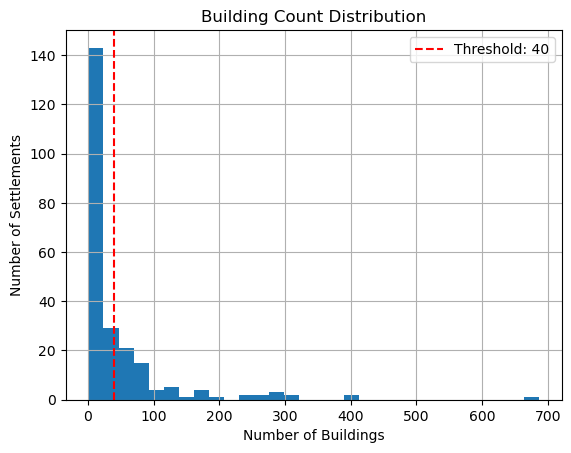

count    235.00000
mean      44.92766
std       81.58242
min        1.00000
25%        4.00000
50%       14.00000
75%       49.00000
max      687.00000
Name: building_count, dtype: float64


In [49]:
import matplotlib.pyplot as plt

nodes_df['building_count'].hist(bins=30)
plt.axvline(40, color='red', linestyle='--', label='Threshold: 40')
plt.title("Building Count Distribution")
plt.xlabel("Number of Buildings")
plt.ylabel("Number of Settlements")
plt.legend()
plt.show()

print(nodes_df['building_count'].describe())


In [66]:
# Center the map on Karabakh
m = folium.Map(location=[39.8, 46.7], zoom_start=9, tiles="CartoDB positron")

# Plot nodes
for name, attr in G_hub.nodes(data=True):
    lat, lon = attr['pos'][1], attr['pos'][0]
    is_hub = name in hub_names
    popup = f"<b>{name}</b><br>Buildings: {attr.get('building_count', 0)}"

    folium.CircleMarker(
        location=[lat, lon],
        radius=9 if is_hub else 5,
        color="green" if is_hub else "blue",
        fill=True,
        fill_opacity=0.8,
        popup=folium.Popup(popup, max_width=250)
    ).add_to(m)

# Plot edges
for u, v, attr in G_hub.edges(data=True):
    lat1, lon1 = G_hub.nodes[u]['pos'][1], G_hub.nodes[u]['pos'][0]
    lat2, lon2 = G_hub.nodes[v]['pos'][1], G_hub.nodes[v]['pos'][0]

    color = "red" if attr.get("type") == "spoke" else "orange"

    folium.PolyLine(
        locations=[[lat1, lon1], [lat2, lon2]],
        color=color,
        weight=1.5 if attr.get("type") == "spoke" else 2.5,
        opacity=0.5,
        tooltip=f"{u} ↔ {v}<br>Distance: {int(attr['weight'])}m"
    ).add_to(m)

# Save and show
m.save("hub_spoke_network.html")
m

In [68]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point, box
import folium
from folium import GeoJson
import numpy as np

# 1. Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(
    nodes_df,
    geometry=gpd.points_from_xy(nodes_df['longitude'], nodes_df['latitude']),
    crs="EPSG:4326"
)

# 2. Project to UTM Zone 38N for distance in meters
gdf_utm = gdf.to_crs(epsg=32638)

# 3. Create 500 km² grid (~22.36 km x 22.36 km)
minx, miny, maxx, maxy = gdf_utm.total_bounds
grid_size = 22360  # meters

grid_cells = []
x = minx
while x < maxx:
    y = miny
    while y < maxy:
        grid_cells.append(box(x, y, x + grid_size, y + grid_size))
        y += grid_size
    x += grid_size

grid = gpd.GeoDataFrame({'geometry': grid_cells}, crs=gdf_utm.crs)

# 4. Spatial join to calculate density
joined = gpd.sjoin(gdf_utm, grid, how='left', predicate='within')
grid['building_sum'] = joined.groupby('index_right')['building_count'].sum()
grid['building_sum'] = grid['building_sum'].fillna(0)

# 5. Select densest cell and convert back to lat/lon
densest_cell = grid.sort_values('building_sum', ascending=False).iloc[0:1]
grid_latlon = grid.to_crs(epsg=4326)
densest_cell_latlon = densest_cell.to_crs(epsg=4326)
gdf_latlon = gdf.to_crs(epsg=4326)

# 6. Create Folium Map
center = densest_cell_latlon.geometry.centroid.iloc[0]
m = folium.Map(location=[center.y, center.x], zoom_start=10, tiles="CartoDB positron")

# Plot settlements
for _, row in gdf_latlon.iterrows():
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=max(3, row['building_count']**0.5 / 3),
        color="blue",
        fill=True,
        fill_opacity=0.7,
        popup=folium.Popup(f"{row['Name']}<br>Buildings: {row['building_count']}", max_width=300)
    ).add_to(m)

# Plot all grid cells
GeoJson(grid_latlon.__geo_interface__, name="Grid", style_function=lambda x: {
    "color": "gray", "weight": 1, "fillOpacity": 0
}).add_to(m)

# Highlight densest cell
GeoJson(densest_cell_latlon.__geo_interface__, name="Densest Region", style_function=lambda x: {
    "color": "red", "weight": 3, "fillOpacity": 0.2
}).add_to(m)

folium.LayerControl().add_to(m)

# Save to HTML
m.save("densest_500km2_map.html")
m


C:\Users\ASUS\AppData\Local\Temp\ipykernel_12152\2837145873.py:45: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  center = densest_cell_latlon.geometry.centroid.iloc[0]


In [29]:
nodes_df

,Name,longitude,latitude,building_count,elevation,hub_score_x,hub_score_y,hub_score
0,Abdal,46.930327,39.870367,21,653.892578,0.106492,0.106492,0.106492
1,Aghbulag,47.081351,39.556504,64,620.917969,0.245918,0.245918,0.245918
2,Aghbulag,46.914963,39.746274,64,1014.918945,0.245918,0.245918,0.245918
3,Aghbulag,46.901836,39.878218,64,776.471924,0.245918,0.245918,0.245918
4,Aghbulag,46.260054,39.778125,64,1792.060547,0.245918,0.245918,0.245918
...,...,...,...,...,...,...,...,...
230,Yukhari Veysalli,47.091967,39.737006,4,391.251801,0.006300,0.006300,0.006300
231,Yukhari Yemishjan,46.834502,39.741052,13,1039.359863,0.200945,0.200945,0.200945
232,Zaghalar,46.357305,40.017377,7,1730.404663,0.030614,0.030614,0.030614
233,Zangilan,46.650707,39.085725,3,445.798645,0.043869,0.043869,0.043869


In [ ]:
import networkx as nx
from sklearn.neighbors import BallTree
import numpy as np
import math
from tqdm import tqdm

# Decide how many hubs you want
N_HUBS = 15  # Adjust as needed

# Create a copy to avoid modifying original
nodes_df = nodes_df.copy()

# Mark top-N nodes as hubs
nodes_df["hub"] = False
top_hubs = nodes_df.nlargest(N_HUBS, "hub_score").index
nodes_df.loc[top_hubs, "hub"] = True

# Parameters
MAX_HUB_DISTANCE = 30_000  # meters

# 1. Separate hubs and settlements
hub_nodes = nodes_df[nodes_df['hub'] == True].copy()
spoke_nodes = nodes_df[nodes_df['hub'] == False].copy()

# 2. Create hub lookup with BallTree
hub_coords = np.radians(hub_nodes[['latitude', 'longitude']].values)
hub_tree = BallTree(hub_coords, metric='haversine')  # Earth distance

# 3. Prepare graph
G_hub = nx.Graph()

# 4. Add all nodes to the graph
for _, row in nodes_df.iterrows():
    G_hub.add_node(
        row['Name'],
        pos=(row['longitude'], row['latitude']),
        building_count=row['building_count'],
        hub=row['hub']
    )

# 5. Connect each spoke to its nearest hub (if within max distance)
R_EARTH = 6371000  # meters

for _, row in tqdm(spoke_nodes.iterrows(), total=len(spoke_nodes), desc="Assigning spokes"):
    spoke_name = row['Name']
    coord_rad = np.radians([[row['latitude'], row['longitude']]])
    dist_rad, idx = hub_tree.query(coord_rad, k=1)
    dist_m = dist_rad[0][0] * R_EARTH

    if dist_m <= MAX_HUB_DISTANCE:
        nearest_hub_name = hub_nodes.iloc[idx[0][0]]['Name']
        try:
            path = nx.shortest_path(G, source=spoke_name, target=nearest_hub_name, weight='cost')
            for u, v in zip(path[:-1], path[1:]):
                if not G_hub.has_edge(u, v):
                    edge_data = G[u][v]
                    G_hub.add_edge(
                        u, v,
                        weight=edge_data.get('cost', edge_data.get('weight')),
                        distance=edge_data['distance_m'],
                        slope=edge_data.get('abs_slope_percent', 0),
                        type='spoke'
                    )
        except nx.NetworkXNoPath:
            print(f"No path between {spoke_name} and {nearest_hub_name}")

# 6. Connect hubs using MST (reuse code if needed)
hub_names = hub_nodes['Name'].tolist()
G_hubs_only = G.subgraph(hub_names).copy()
mst_hubs = nx.minimum_spanning_tree(G_hubs_only, weight='cost')

# Add MST hub edges to main graph
for u, v, attr in mst_hubs.edges(data=True):
    G_hub.add_edge(u, v, **attr, type='hub')

print("✅ Hub-and-spoke graph built with limited spoke radius.")


Assigning spokes:   0%|          | 0/220 [00:00<?, ?it/s]


KeyError: 'distance_m'

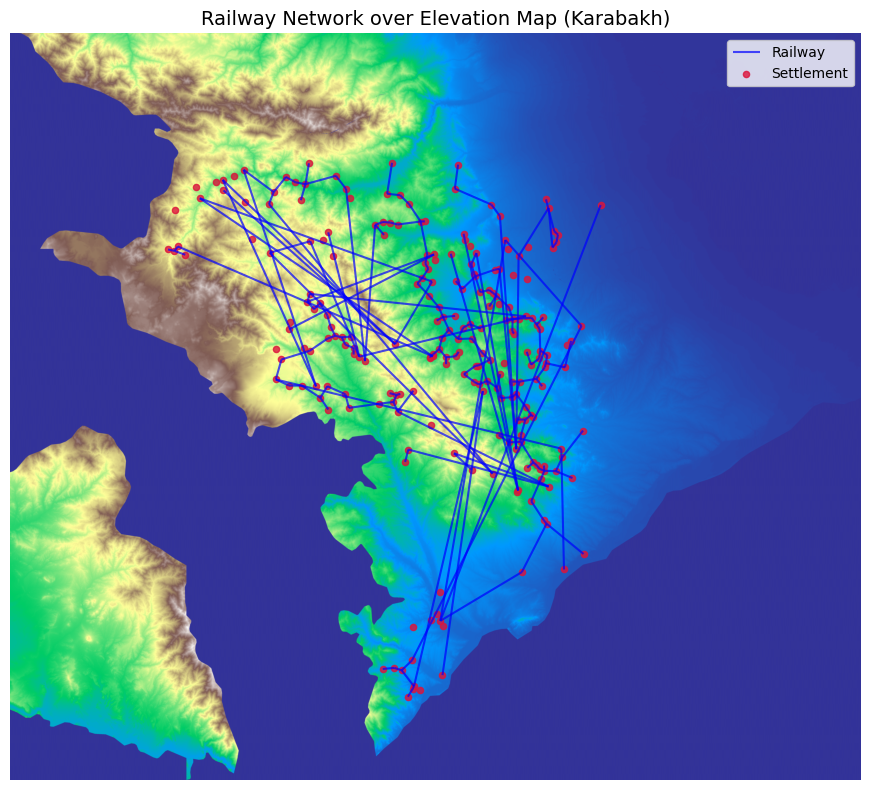

In [35]:
import geopandas as gpd
import pandas as pd
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
from shapely.geometry import LineString

# Load clipped elevation
dem_path = "clipped_karabakh_dem.tif"
src = rasterio.open(dem_path)
elevation = src.read(1)

# Load settlements
nodes_df = pd.read_csv("settlements_without_nakhchivan.csv")
nodes_df = nodes_df[nodes_df['building_count'] > 0].copy()
gdf_nodes = gpd.GeoDataFrame(
    nodes_df,
    geometry=gpd.points_from_xy(nodes_df.longitude, nodes_df.latitude),
    crs="EPSG:4326"
).to_crs(src.crs)

# Load railway edges
edges_df = pd.read_csv("optimal_railway_network.csv")

# Create edge geometries as LineStrings
edge_geoms = []
for _, row in edges_df.iterrows():
    if row['from'] in nodes_df['Name'].values and row['to'] in nodes_df['Name'].values:
        point_from = gdf_nodes[gdf_nodes['Name'] == row['from']].geometry.values[0]
        point_to = gdf_nodes[gdf_nodes['Name'] == row['to']].geometry.values[0]
        edge_geoms.append(LineString([point_from, point_to]))
gdf_edges = gpd.GeoDataFrame(geometry=edge_geoms, crs=gdf_nodes.crs)

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
show(src, ax=ax, cmap='terrain')
gdf_edges.plot(ax=ax, color='blue', linewidth=1.5, alpha=0.7, label="Railway")
gdf_nodes.plot(ax=ax, markersize=20, color='crimson', alpha=0.8, label="Settlement")

ax.set_title("Railway Network over Elevation Map (Karabakh)", fontsize=14)
ax.legend()
plt.axis('off')
plt.tight_layout()
plt.show()


In [20]:
from itertools import combinations
import networkx as nx
from tqdm import tqdm

# Settlements with ≥50 buildings
valid_nodes = [n for n, attr in G_hub.nodes(data=True)
               if attr.get('building_count', 0) >= 50]

node_pairs = list(combinations(valid_nodes, 2))

path_results = []

for u, v in tqdm(node_pairs, desc="Evaluating building-rich paths"):
    try:
        path = nx.shortest_path(G_hub, source=u, target=v, weight='weight')
        # Ensure path includes at least one hub (excluding start and end)
        if not any(node in hub_names for node in path[1:-1]):
            continue
        
        building_sum = sum(G_hub.nodes[n].get('building_count', 0) for n in path)
        
        path_results.append({
            'from': u,
            'to': v,
            'path': path,
            'building_sum': building_sum,
            'distance_m': sum(
                G_hub[path[i]][path[i+1]]['weight'] for i in range(len(path)-1)
            )
        })
    except nx.NetworkXNoPath:
        continue

top_paths_by_building = sorted(path_results, key=lambda x: x['building_sum'], reverse=True)[:5]

import folium

m = folium.Map(location=[39.8, 46.8], zoom_start=9, tiles='CartoDB positron')

# Plot nodes
for name, attr in G_hub.nodes(data=True):
    lat, lon = attr['pos'][1], attr['pos'][0]
    color = "green" if name in hub_names else "blue"
    folium.CircleMarker(
        location=[lat, lon],
        radius=6 if name in hub_names else 4,
        color=color,
        fill=True,
        fill_opacity=0.9,
        popup=folium.Popup(f"{name}<br>Buildings: {attr.get('building_count', 0)}", max_width=250)
    ).add_to(m)

# Plot paths
for entry in top_paths_by_building:
    coords = [[G_hub.nodes[n]['pos'][1], G_hub.nodes[n]['pos'][0]] for n in entry['path']]
    tooltip = (f"{entry['from']} ↔ {entry['to']}<br>"
               f"Buildings: {entry['building_sum']}<br>"
               f"Distance: {int(entry['distance_m'])} m")
    
for i in range(len(coords) - 1):
    folium.PolyLine(
        locations=[coords[i], coords[i + 1]],
        color='red',
        weight=4,
        opacity=0.75
    ).add_to(m)


m.save("top_5_building_routes.html")
m


Evaluating building-rich paths: 100%|██████████| 1128/1128 [00:00<00:00, 23291.48it/s]
